In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objects as go
from sklearn.model_selection import train_test_split
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import LSTM
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import TimeSeriesSplit
from keras.layers import Dropout
from sklearn.metrics import mean_squared_error,mean_absolute_percentage_error as mape,mean_absolute_error as mae
from keras import optimizers

# Prepare Data

In [2]:
def preparedata(file):
    cloud_cover = pd.read_csv(file, skipinitialspace = True)
    cloud_cover['Date'] = cloud_cover[['Year', 'Month', 'Day']].apply(lambda x: "{0}-{1}-{2}".format(str(x[0]).zfill(2), str(x[1]).zfill(2), str(x[2]).zfill(2)), axis=1) 
    cloud_cover['Time'] = cloud_cover[['Hour', 'Minute']].apply(lambda x: "{}:{}".format(str(x[0]).zfill(2), str(x[1]).zfill(2)), axis=1)
    cloud_cover.drop(["Year", "Month", "Day", "Hour", "Minute", "Second"], axis=1, inplace=True)  
    cloud_cover = cloud_cover.rename(columns={"CloudCover":"cloud_cover"})
    cloud_cover = cloud_cover.groupby(['Date', 'Time']).agg(cloud_cover=('cloud_cover','mean')).reset_index()
    cloud_cover['DateTime'] = cloud_cover[['Date', 'Time']].apply(lambda x: "{} {}".format(str(x[0]).zfill(2), str(x[1]).zfill(2)), axis=1)
    cloud_cover.drop(["Date", "Time"], axis=1, inplace=True)        
    cloud_cover['DateTime'] = pd.to_datetime(cloud_cover['DateTime'], format="%Y-%m-%d %H:%M")
    cloud_cover.dropna(inplace=True)
    return cloud_cover

In [3]:
cloud_cover = preparedata('../prophet_ver2/Bangkhuntean_CloudCover_2021-16Nov-16Dec.csv')
cloud_cover

,cloud_cover,DateTime
0,0.990000,2021-11-16 11:15:00
1,0.989000,2021-11-16 11:16:00
2,0.987667,2021-11-16 11:17:00
3,0.987000,2021-11-16 11:18:00
4,0.987000,2021-11-16 11:19:00
...,...,...
15056,0.168000,2021-12-16 13:58:00
15057,0.169000,2021-12-16 13:59:00
15058,0.147000,2021-12-16 14:00:00
15059,0.145000,2021-12-16 14:01:00


In [4]:
def lags_train_test(data, lags):
	X, y = [], []
	for i in range(lags, len(data)):
		X.append(data[i-lags:i])
		y.append(data[i])
	return np.array(X), np.array(y)

In [5]:
def Xtrain_ytrain(train,test,lags):
    #scale train
    sc = MinMaxScaler()
    sc.fit(train)
    train_set_scale = sc.transform(train)
    # train
    X_train, y_train = lags_train_test(train_set_scale, lags)
    X_train = np.reshape(X_train, (X_train.shape[0], X_train.shape[1], 1))
    print("X_train Shape :", X_train.shape)
    print("y_train Shape :", y_train.shape)

    #scale test
    dataset_total = pd.concat((train['cloud_cover'], test['cloud_cover']), axis=0)
    inputs = dataset_total[len(dataset_total) - len(test) - lags:].values
    inputs = inputs.reshape(-1,1)
    inputs = sc.transform(inputs)
    # test
    X_test, y_test = lags_train_test(inputs, lags)
    print("X_test Shape : ", X_test.shape)
    print("y_test Shape : ", y_test.shape)
    return X_train, y_train, X_test, y_test, sc

In [6]:
def plot_curve(history):
    # loss curves
    fig1 = plt.figure(figsize=[8,6])
    loss = history.history['loss']
    val_loss = history.history['val_loss']

    epochs = range(1, len(loss) + 1)

    plt.plot(epochs, loss, 'orange', label='Training loss')
    plt.plot(epochs, val_loss, 'b', label='Validation loss')
    plt.title('Training and validation loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()

In [7]:
def plot_curve(history):
    # loss curves
    fig1 = plt.figure(figsize=[8,6])
    loss = history.history['loss']
    val_loss = history.history['val_loss']

    epochs = range(1, len(loss) + 1)

    plt.plot(epochs, loss, 'orange', label='Training loss')
    plt.plot(epochs, val_loss, 'b', label='Validation loss')
    plt.title('Training and validation loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()

In [8]:
def plot_test(train,pred):
    fig2 = go.Figure()
    fig2.add_trace(go.Scatter(mode = 'lines', x = train['DateTime'], y = train['cloud_cover'], name = 'Train'))
    fig2.add_trace(go.Scatter(mode = 'lines', x = pred['DateTime'], y = pred['cloud_cover'], name = 'Actual'))
    fig2.add_trace(go.Scatter(mode = 'lines', x = pred['DateTime'], y = pred['LSTM'], name = 'Predict'))
    fig2.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
    )


    fig2.update_layout(
        xaxis=dict(
            rangeselector=dict(
                buttons=list([
                    dict(count=1,
                        label="1.zoom",
                        step="hour",
                        stepmode="backward"),
                    dict(count=2,
                        label="2.zoom",
                        step="hour",
                        stepmode="backward"),
                    dict(count=3,
                        label="3.zoom",
                        step="day",
                        stepmode="backward"),              

                    dict(step="all")
                ])
            ),
            rangeslider=dict(
                visible=True
            ),
            type="date"
        )
    )

    fig2.show()

In [9]:
def compare_model(model,model_1):
    mse_error = [model,model_1]
    error = pd.DataFrame({"Model" : ['model','model_1'], "MSE error": mse_error})
    if model < model_1:
        model = model
        print("Better MSE value is : " , model)
    else:
        model_1 = model_1
        print("Better MSE value is : ", model_1)
    return error

In [10]:
def error(error1,error2,error3,error4):
    error = pd.DataFrame(columns=['MSE', 'RMSE', 'MAE', 'MAPE'])
    error = [{'MSE' : error1,'RMSE':error2,'MAE':error3,'MAPE':error4}] 
    return error

# Train/Test Model

In [11]:
train,test = train_test_split(cloud_cover, train_size=0.8, shuffle=False)
print('Train Shape', train.shape)
print('Test Shape', test.shape)

Train Shape (12048, 2)
Test Shape (3013, 2)


In [12]:
train

,cloud_cover,DateTime
0,0.990000,2021-11-16 11:15:00
1,0.989000,2021-11-16 11:16:00
2,0.987667,2021-11-16 11:17:00
3,0.987000,2021-11-16 11:18:00
4,0.987000,2021-11-16 11:19:00
...,...,...
12043,0.647000,2021-12-10 15:19:00
12044,0.654000,2021-12-10 15:20:00
12045,0.654000,2021-12-10 15:21:00
12046,0.578000,2021-12-10 15:22:00


In [13]:
train = train.set_index('DateTime')
test = test.set_index('DateTime')

In [14]:
# X_train, y_train, X_test and y_test
X_train, y_train, X_test, y_test, sc = Xtrain_ytrain(train,test,20)

X_train Shape : (12028, 20, 1)
y_train Shape : (12028, 1)
X_test Shape :  (3013, 20, 1)
y_test Shape :  (3013, 1)


c:\Users\USER\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(


In [15]:
train.reset_index(inplace=True)
test.reset_index(inplace=True)

## Optimizer adam

### batch size 32 Add frist layer units = 50 epochs 10 

In [16]:
test1 = test.copy()

In [36]:
model_50_adam = Sequential()
model_50_adam.add(LSTM(units = 50, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_50_adam.add(Dense(units = 1))
model_50_adam.compile(optimizer = 'adam', loss = 'mean_squared_error')
hist_adam = model_50_adam.fit(X_train, y_train, validation_data=(X_test, y_test), epochs = 10, batch_size = 32)

Epoch 1/10
376/376 [==============================] - 8s 12ms/step - loss: 0.0175 - val_loss: 0.0046
Epoch 2/10
376/376 [==============================] - 4s 11ms/step - loss: 0.0030 - val_loss: 0.0037
Epoch 3/10
376/376 [==============================] - 4s 10ms/step - loss: 0.0023 - val_loss: 0.0032
Epoch 4/10
376/376 [==============================] - 4s 10ms/step - loss: 0.0019 - val_loss: 0.0028
Epoch 5/10
376/376 [==============================] - 4s 9ms/step - loss: 0.0015 - val_loss: 0.0025
Epoch 6/10
376/376 [==============================] - 4s 10ms/step - loss: 0.0014 - val_loss: 0.0023
Epoch 7/10
376/376 [==============================] - 4s 9ms/step - loss: 0.0012 - val_loss: 0.0022
Epoch 8/10
376/376 [==============================] - 4s 9ms/step - loss: 0.0011 - val_loss: 0.0021
Epoch 9/10
376/376 [==============================] - 4s 9ms/step - loss: 0.0011 - val_loss: 0.0020
Epoch 10/10
376/376 [==============================] - 4s 10ms/step - loss: 0.0010 - val_loss: 

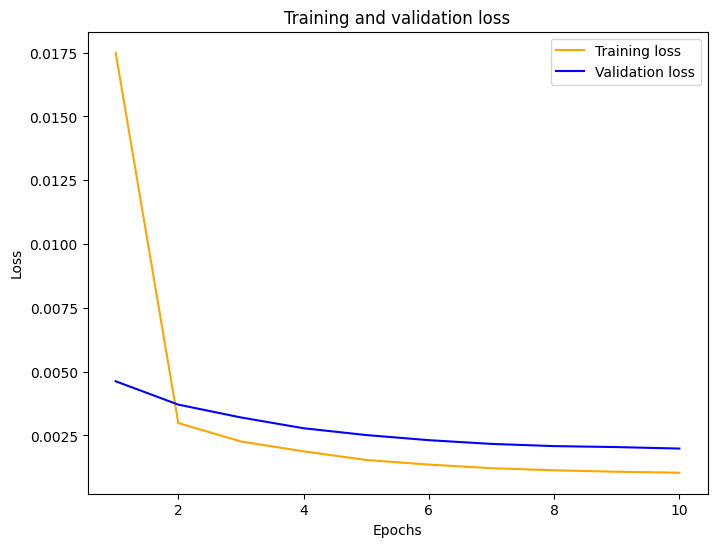

In [37]:
plot_curve(hist_adam)

In [38]:
predict_scaled_adam = model_50_adam.predict(X_test)
predict_adam = sc.inverse_transform(predict_scaled_adam)
test1['LSTM_adam'] = predict_adam
test1

95/95 [==============================] - 1s 4ms/step


,DateTime,cloud_cover,LSTM_adam,LSTM_50_rms
0,2021-12-10 15:24:00,0.538,0.551986,0.548866
1,2021-12-10 15:25:00,0.588,0.537165,0.531954
2,2021-12-10 15:26:00,0.566,0.579224,0.583722
3,2021-12-10 15:27:00,0.562,0.570593,0.561198
4,2021-12-10 15:28:00,0.612,0.559534,0.557510
...,...,...,...,...
3008,2021-12-16 13:58:00,0.168,0.168755,0.167236
3009,2021-12-16 13:59:00,0.169,0.168213,0.167170
3010,2021-12-16 14:00:00,0.147,0.168801,0.168099
3011,2021-12-16 14:01:00,0.145,0.153251,0.147466


In [39]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test1['DateTime'], y = test1['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test1['DateTime'], y = test1['LSTM_adam'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [40]:
lstm_mse_error_unit_50_adam = mean_squared_error(test1['cloud_cover'], test1['LSTM_adam'], squared=True)
lstm_rmse_error = mean_squared_error(test1["cloud_cover"], test1["LSTM_adam"], squared=False)
lstm_mae_error = mae(test1["cloud_cover"], test1["LSTM_adam"])
lstm_mape_error = mape(test1['cloud_cover'], test1['LSTM_adam'])
error(lstm_mse_error_unit_50_adam,lstm_rmse_error,lstm_mae_error,lstm_mape_error)


[{'MSE': 0.0019765517640122094,
  'RMSE': 0.04445842736773546,
  'MAE': 0.020944390016173032,
  'MAPE': 0.07768008205961537}]

In [151]:
mse_data = pd.DataFrame(columns=['Lags' ,'Optimizer', 'Batch_size', 'Learning rate', 'Frist layer', 'Drop out', 'Second layer', 'Drop out2', 'Third layer', 
                                 'Output layer', 'Epochs', 'MAE error', 'MAPE error','MSE error', 'RMSE error'])

data = [{'Lags':20 ,'Optimizer':'Adam', 'Batch_size':32, 'Learning rate':'', 'Frist layer': 50, 'Drop out':'', 'Second layer':'', 'Drop out2':'',
              'Third layer':'','Output layer':1, 'Epochs':10 , 'MAE error':lstm_mae_error, 'MAPE error' : lstm_mape_error,'MSE error':lstm_mse_error_unit_50_adam, 'RMSE error':lstm_rmse_error} ]

mse_data = mse_data.append(data,ignore_index = True,sort = False)
mse_data

C:\Users\USER\AppData\Local\Temp\ipykernel_15584\2964973739.py:7: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



,Lags,Optimizer,Batch_size,Learning rate,Frist layer,Drop out,Second layer,Drop out2,Third layer,Output layer,Epochs,MAE error,MAPE error,MSE error,RMSE error
0,20,Adam,32,,50,,,,,1,10,0.020944,0.07768,0.001977,0.044458


---

## Optimizer RMSprop

### Add frist layer: units = 50

In [48]:
model_50_rms = Sequential()
model_50_rms.add(LSTM(units = 50, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_50_rms.add(Dense(units = 1))
model_50_rms.compile(optimizer = 'RMSprop', loss = 'mean_squared_error')
hist_50_rms = model_50_rms.fit(X_train, y_train, validation_data=(X_test, y_test), epochs = 10, batch_size = 32)

Epoch 1/10
376/376 [==============================] - 9s 13ms/step - loss: 0.0070 - val_loss: 0.0032
Epoch 2/10
376/376 [==============================] - 4s 12ms/step - loss: 0.0018 - val_loss: 0.0024
Epoch 3/10
376/376 [==============================] - 3s 9ms/step - loss: 0.0013 - val_loss: 0.0022
Epoch 4/10
376/376 [==============================] - 4s 10ms/step - loss: 0.0012 - val_loss: 0.0020
Epoch 5/10
376/376 [==============================] - 3s 9ms/step - loss: 0.0011 - val_loss: 0.0020
Epoch 6/10
376/376 [==============================] - 3s 9ms/step - loss: 0.0011 - val_loss: 0.0020
Epoch 7/10
376/376 [==============================] - 3s 9ms/step - loss: 0.0010 - val_loss: 0.0021
Epoch 8/10
376/376 [==============================] - 3s 8ms/step - loss: 0.0010 - val_loss: 0.0020
Epoch 9/10
376/376 [==============================] - 3s 9ms/step - loss: 0.0010 - val_loss: 0.0021
Epoch 10/10
376/376 [==============================] - 3s 9ms/step - loss: 0.0010 - val_loss: 0.0

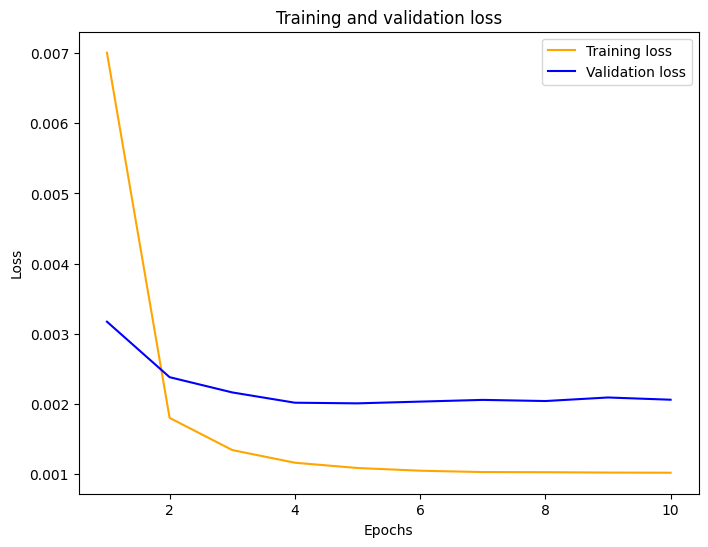

In [49]:
plot_curve(hist_50_rms)

In [50]:
predict_scaled_50_rms = model_50_rms.predict(X_test)
predict_50_rms = sc.inverse_transform(predict_scaled_50_rms)
test1['LSTM_50_rms'] = predict_50_rms
test1

95/95 [==============================] - 1s 5ms/step


,DateTime,cloud_cover,LSTM_adam,LSTM_50_rms
0,2021-12-10 15:24:00,0.538,0.551986,0.553465
1,2021-12-10 15:25:00,0.588,0.537165,0.536754
2,2021-12-10 15:26:00,0.566,0.579224,0.589897
3,2021-12-10 15:27:00,0.562,0.570593,0.565705
4,2021-12-10 15:28:00,0.612,0.559534,0.562481
...,...,...,...,...
3008,2021-12-16 13:58:00,0.168,0.168755,0.175470
3009,2021-12-16 13:59:00,0.169,0.168213,0.175423
3010,2021-12-16 14:00:00,0.147,0.168801,0.176399
3011,2021-12-16 14:01:00,0.145,0.153251,0.155341


In [51]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test1['DateTime'], y = test1['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test1['DateTime'], y = test1['LSTM_50_rms'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [52]:
lstm_mse_error_unit_50_rms = mean_squared_error(test1['cloud_cover'], test1['LSTM_50_rms'], squared=True)
lstm_rmse_error1 = mean_squared_error(test1["cloud_cover"], test1["LSTM_50_rms"], squared=False)
lstm_mae_error1 = mae(test1["cloud_cover"], test1["LSTM_50_rms"])
lstm_mape_error1 = mape(test1['cloud_cover'], test1['LSTM_50_rms'])
error(lstm_mse_error_unit_50_rms,lstm_rmse_error1,lstm_mae_error1,lstm_mape_error1)

[{'MSE': 0.0020513219051571147,
  'RMSE': 0.0452915213385145,
  'MAE': 0.02233209887733995,
  'MAPE': 0.10308918218275727}]

In [53]:
compare_model(lstm_mape_error,lstm_mape_error1)

Better MSE value is :  0.07768008205961537


,Model,MSE error
0,model,0.077680
1,model_1,0.103089


In [152]:
data1 = [{'Lags':20 ,'Optimizer':'RMSprop', 'Batch_size':32, 'Learning rate':'', 'Frist layer': 50, 'Drop out':'', 'Second layer':'', 'Drop out2':'',
              'Third layer':'','Output layer':1, 'Epochs':10 , 'MAE error':lstm_mae_error1, 'MAPE error' : lstm_mape_error1,'MSE error':lstm_mse_error_unit_50_rms, 'RMSE error':lstm_rmse_error1}]

mse_data = mse_data.append(data1,ignore_index = True,sort = False)
mse_data

C:\Users\USER\AppData\Local\Temp\ipykernel_15584\2368469829.py:4: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



,Lags,Optimizer,Batch_size,Learning rate,Frist layer,Drop out,Second layer,Drop out2,Third layer,Output layer,Epochs,MAE error,MAPE error,MSE error,RMSE error
0,20,Adam,32,,50,,,,,1,10,0.020944,0.077680,0.001977,0.044458
1,20,RMSprop,32,,50,,,,,1,10,0.022332,0.103089,0.002051,0.045292


---

## Optimizer adam

### Add frist layer: units = 50 and batch_size 64

In [55]:
model_batch_size64 = Sequential()
model_batch_size64.add(LSTM(units = 50, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_batch_size64.add(Dense(units = 1))
model_batch_size64.compile(optimizer = 'adam', loss = 'mean_squared_error')
hist_batch_size64 = model_batch_size64.fit(X_train, y_train, validation_data=(X_test, y_test),  epochs = 10, batch_size = 64)

Epoch 1/10
188/188 [==============================] - 6s 16ms/step - loss: 0.0092 - val_loss: 0.0039
Epoch 2/10
188/188 [==============================] - 3s 17ms/step - loss: 0.0026 - val_loss: 0.0035
Epoch 3/10
188/188 [==============================] - 3s 14ms/step - loss: 0.0022 - val_loss: 0.0033
Epoch 4/10
188/188 [==============================] - 2s 11ms/step - loss: 0.0019 - val_loss: 0.0029
Epoch 5/10
188/188 [==============================] - 2s 11ms/step - loss: 0.0017 - val_loss: 0.0028
Epoch 6/10
188/188 [==============================] - 2s 11ms/step - loss: 0.0015 - val_loss: 0.0025
Epoch 7/10
188/188 [==============================] - 2s 11ms/step - loss: 0.0014 - val_loss: 0.0023
Epoch 8/10
188/188 [==============================] - 2s 10ms/step - loss: 0.0013 - val_loss: 0.0022
Epoch 9/10
188/188 [==============================] - 2s 10ms/step - loss: 0.0012 - val_loss: 0.0022
Epoch 10/10
188/188 [==============================] - 2s 11ms/step - loss: 0.0011 - val_lo

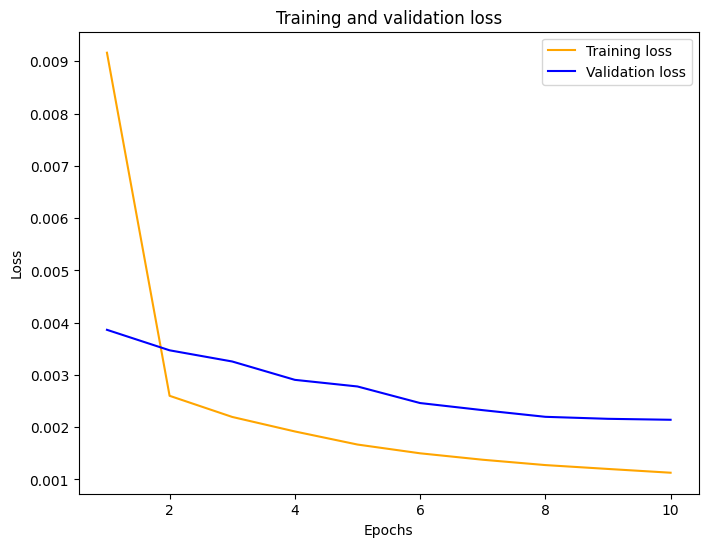

In [56]:
plot_curve(hist_batch_size64)

In [57]:
predict_scaled_batch_size64 = model_batch_size64.predict(X_test)
predict_batch_size64 = sc.inverse_transform(predict_scaled_batch_size64)
test1['LSTM_4_batch_size'] = predict_batch_size64
test1

95/95 [==============================] - 1s 3ms/step


,DateTime,cloud_cover,LSTM_adam,LSTM_50_rms,LSTM_4_batch_size
0,2021-12-10 15:24:00,0.538,0.551986,0.553465,0.546242
1,2021-12-10 15:25:00,0.588,0.537165,0.536754,0.525330
2,2021-12-10 15:26:00,0.566,0.579224,0.589897,0.559302
3,2021-12-10 15:27:00,0.562,0.570593,0.565705,0.560826
4,2021-12-10 15:28:00,0.612,0.559534,0.562481,0.554758
...,...,...,...,...,...
3008,2021-12-16 13:58:00,0.168,0.168755,0.175470,0.162269
3009,2021-12-16 13:59:00,0.169,0.168213,0.175423,0.161949
3010,2021-12-16 14:00:00,0.147,0.168801,0.176399,0.162389
3011,2021-12-16 14:01:00,0.145,0.153251,0.155341,0.150008


In [58]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test1['DateTime'], y = test1['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test1['DateTime'], y = test1['LSTM_4_batch_size'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [59]:
lstm_mse_error_batch_size64 = mean_squared_error(test1['cloud_cover'], test1['LSTM_4_batch_size'], squared=True)
lstm_rmse_error2 = mean_squared_error(test1["cloud_cover"], test1["LSTM_4_batch_size"], squared=False)
lstm_mae_error2 = mae(test1["cloud_cover"], test1["LSTM_4_batch_size"])
lstm_mape_error2 = mape(test1['cloud_cover'], test1['LSTM_4_batch_size'])
error(lstm_mse_error_batch_size64,lstm_rmse_error2,lstm_mae_error2,lstm_mape_error2)

[{'MSE': 0.0021317129928072067,
  'RMSE': 0.04617047750248211,
  'MAE': 0.02425351926982353,
  'MAPE': 0.09060074543104994}]

In [60]:
compare_model(lstm_mape_error,lstm_mape_error2)

Better MSE value is :  0.07768008205961537


,Model,MSE error
0,model,0.077680
1,model_1,0.090601


In [153]:
data2 = [{'Lags':20 ,'Optimizer':'Adam', 'Batch_size':64, 'Learning rate':'', 'Frist layer': 50, 'Drop out':'', 'Second layer':'', 'Drop out2':'',
              'Third layer':'','Output layer':1, 'Epochs':10 , 'MAE error':lstm_mae_error2, 'MAPE error' : lstm_mape_error2,'MSE error':lstm_mse_error_batch_size64
              , 'RMSE error':lstm_rmse_error2}]

mse_data = mse_data.append(data2,ignore_index = True,sort = False)
mse_data

C:\Users\USER\AppData\Local\Temp\ipykernel_15584\860760922.py:5: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



,Lags,Optimizer,Batch_size,Learning rate,Frist layer,Drop out,Second layer,Drop out2,Third layer,Output layer,Epochs,MAE error,MAPE error,MSE error,RMSE error
0,20,Adam,32,,50,,,,,1,10,0.020944,0.077680,0.001977,0.044458
1,20,RMSprop,32,,50,,,,,1,10,0.022332,0.103089,0.002051,0.045292
2,20,Adam,64,,50,,,,,1,10,0.024254,0.090601,0.002132,0.046170


---

### learning rate 0.1

In [62]:
test2 = test.copy()

#### Add frist layer: units = 50

In [63]:
model_01 = Sequential()
model_01.add(LSTM(units = 50, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_01.add(Dense(units = 1))
opt = optimizers.Adam(learning_rate=0.1)
model_01.compile(optimizer = opt, loss = 'mean_squared_error')
hist_01 = model_01.fit(X_train, y_train, validation_data=(X_test, y_test), epochs = 10, batch_size = 32)

Epoch 1/10
376/376 [==============================] - 7s 12ms/step - loss: 0.2006 - val_loss: 0.0021
Epoch 2/10
376/376 [==============================] - 3s 9ms/step - loss: 0.0011 - val_loss: 0.0022
Epoch 3/10
376/376 [==============================] - 3s 9ms/step - loss: 0.0012 - val_loss: 0.0021
Epoch 4/10
376/376 [==============================] - 3s 8ms/step - loss: 0.0013 - val_loss: 0.0038
Epoch 5/10
376/376 [==============================] - 3s 8ms/step - loss: 0.0014 - val_loss: 0.0022
Epoch 6/10
376/376 [==============================] - 3s 9ms/step - loss: 0.0014 - val_loss: 0.0024
Epoch 7/10
376/376 [==============================] - 3s 8ms/step - loss: 0.0013 - val_loss: 0.0022
Epoch 8/10
376/376 [==============================] - 3s 9ms/step - loss: 0.0012 - val_loss: 0.0023
Epoch 9/10
376/376 [==============================] - 3s 8ms/step - loss: 0.0014 - val_loss: 0.0026
Epoch 10/10
376/376 [==============================] - 3s 9ms/step - loss: 0.0012 - val_loss: 0.002

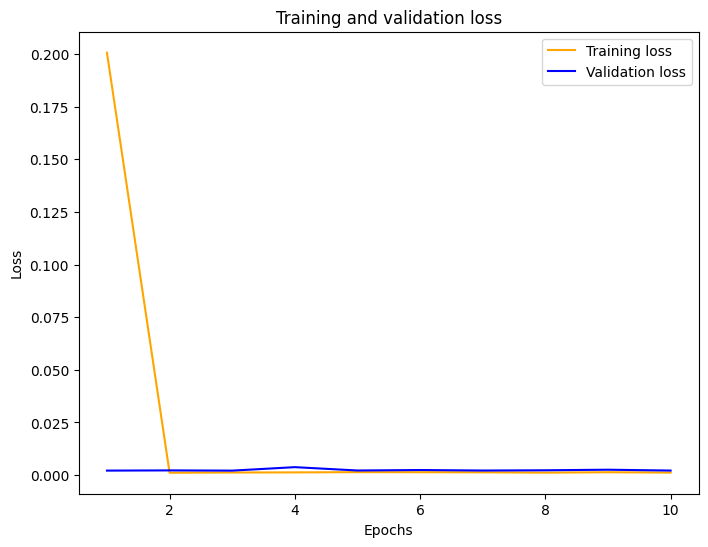

In [64]:
plot_curve(hist_01)

In [65]:
predict_scaled_01 = model_01.predict(X_test)
predict_01 = sc.inverse_transform(predict_scaled_01)
test2['LSTM_01'] = predict_01
test2

95/95 [==============================] - 1s 4ms/step


,DateTime,cloud_cover,LSTM_01
0,2021-12-10 15:24:00,0.538,0.536176
1,2021-12-10 15:25:00,0.588,0.526025
2,2021-12-10 15:26:00,0.566,0.589028
3,2021-12-10 15:27:00,0.562,0.563196
4,2021-12-10 15:28:00,0.612,0.553260
...,...,...,...
3008,2021-12-16 13:58:00,0.168,0.166788
3009,2021-12-16 13:59:00,0.169,0.166380
3010,2021-12-16 14:00:00,0.147,0.167996
3011,2021-12-16 14:01:00,0.145,0.144718


In [66]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test2['DateTime'], y = test2['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test2['DateTime'], y = test2['LSTM_01'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [67]:
lstm_mse_error_unit_50_01 = mean_squared_error(test2['cloud_cover'], test2['LSTM_01'], squared=True)
lstm_rmse_error3 = mean_squared_error(test2["cloud_cover"], test2["LSTM_01"], squared=False)
lstm_mae_error3 = mae(test2["cloud_cover"], test2["LSTM_01"])
lstm_mape_error3 = mape(test2['cloud_cover'], test2['LSTM_01'])
error(lstm_mse_error_unit_50_01,lstm_rmse_error3,lstm_mae_error3,lstm_mape_error3)

[{'MSE': 0.002141888121570165,
  'RMSE': 0.046280537178928306,
  'MAE': 0.021807542824286222,
  'MAPE': 0.0774362034791545}]

In [68]:
compare_model(lstm_mape_error,lstm_mape_error3)

Better MSE value is :  0.0774362034791545


,Model,MSE error
0,model,0.077680
1,model_1,0.077436


In [154]:
data3 = [{'Lags':20 ,'Optimizer':'Adam', 'Batch_size':32, 'Learning rate':0.1, 'Frist layer': 50, 'Drop out':'', 'Second layer':'', 'Drop out2':'',
              'Third layer':'','Output layer':1, 'Epochs':10 , 'MAE error':lstm_mae_error3, 'MAPE error' : lstm_mape_error3,'MSE error':lstm_mse_error_unit_50_01, 'RMSE error':lstm_rmse_error3}]

mse_data = mse_data.append(data3,ignore_index = True,sort = False)
mse_data

C:\Users\USER\AppData\Local\Temp\ipykernel_15584\3324932465.py:4: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



,Lags,Optimizer,Batch_size,Learning rate,Frist layer,Drop out,Second layer,Drop out2,Third layer,Output layer,Epochs,MAE error,MAPE error,MSE error,RMSE error
0,20,Adam,32,,50,,,,,1,10,0.020944,0.077680,0.001977,0.044458
1,20,RMSprop,32,,50,,,,,1,10,0.022332,0.103089,0.002051,0.045292
2,20,Adam,64,,50,,,,,1,10,0.024254,0.090601,0.002132,0.046170
3,20,Adam,32,0.1,50,,,,,1,10,0.021808,0.077436,0.002142,0.046281


----------------------------------------------------------------------------------

### lr 0.05

#### Add frist layer: units = 50

In [70]:
model_005 = Sequential()
model_005.add(LSTM(units = 50, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_005.add(Dense(units = 1))
opt = optimizers.Adam(learning_rate=0.05)
model_005.compile(optimizer = opt, loss = 'mean_squared_error')
hist_005 = model_005.fit(X_train, y_train, validation_data=(X_test, y_test), epochs = 10, batch_size = 32)

Epoch 1/10
376/376 [==============================] - 7s 10ms/step - loss: 0.0678 - val_loss: 0.0027
Epoch 2/10
376/376 [==============================] - 3s 8ms/step - loss: 0.0019 - val_loss: 0.0059
Epoch 3/10
376/376 [==============================] - 3s 8ms/step - loss: 0.0028 - val_loss: 0.0025
Epoch 4/10
376/376 [==============================] - 3s 8ms/step - loss: 0.0023 - val_loss: 0.0024
Epoch 5/10
376/376 [==============================] - 3s 9ms/step - loss: 0.0025 - val_loss: 0.0028
Epoch 6/10
376/376 [==============================] - 3s 8ms/step - loss: 0.0023 - val_loss: 0.0026
Epoch 7/10
376/376 [==============================] - 3s 9ms/step - loss: 0.0025 - val_loss: 0.0022
Epoch 8/10
376/376 [==============================] - 3s 8ms/step - loss: 0.0020 - val_loss: 0.0031
Epoch 9/10
376/376 [==============================] - 3s 8ms/step - loss: 0.0018 - val_loss: 0.0023
Epoch 10/10
376/376 [==============================] - 3s 9ms/step - loss: 0.0015 - val_loss: 0.002

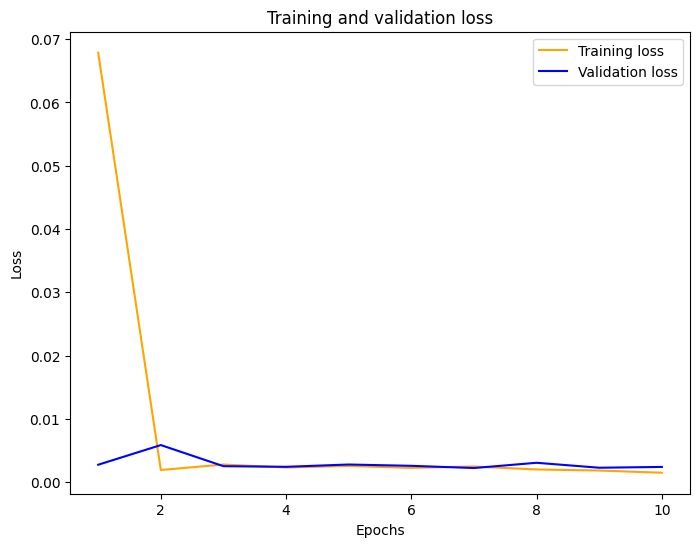

In [71]:
plot_curve(hist_005)

In [72]:
predict_scaled_005 = model_005.predict(X_test)
predict_005 = sc.inverse_transform(predict_scaled_005)
test2['LSTM_005'] = predict_005
test2

95/95 [==============================] - 1s 3ms/step


,DateTime,cloud_cover,LSTM_01,LSTM_005
0,2021-12-10 15:24:00,0.538,0.536176,0.554719
1,2021-12-10 15:25:00,0.588,0.526025,0.542123
2,2021-12-10 15:26:00,0.566,0.589028,0.602607
3,2021-12-10 15:27:00,0.562,0.563196,0.569352
4,2021-12-10 15:28:00,0.612,0.553260,0.567181
...,...,...,...,...
3008,2021-12-16 13:58:00,0.168,0.166788,0.166853
3009,2021-12-16 13:59:00,0.169,0.166380,0.167379
3010,2021-12-16 14:00:00,0.147,0.167996,0.168440
3011,2021-12-16 14:01:00,0.145,0.144718,0.143062


In [73]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test2['DateTime'], y = test2['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test2['DateTime'], y = test2['LSTM_005'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [74]:
lstm_mse_error_unit_50_005 = mean_squared_error(test2['cloud_cover'], test2['LSTM_005'], squared=True)
lstm_rmse_error4 = mean_squared_error(test2["cloud_cover"], test2["LSTM_005"], squared=False)
lstm_mae_error4 = mae(test2["cloud_cover"], test2["LSTM_005"])
lstm_mape_error4 = mape(test2['cloud_cover'], test2['LSTM_005'])

error(lstm_mse_error_unit_50_005,lstm_rmse_error4,lstm_mae_error4,lstm_mape_error4)

[{'MSE': 0.002386500630745756,
  'RMSE': 0.0488518232080007,
  'MAE': 0.02534146617812349,
  'MAPE': 0.10742094195962167}]

In [76]:
compare_model(lstm_mape_error3,lstm_mape_error4)

Better MSE value is :  0.0774362034791545


,Model,MSE error
0,model,0.077436
1,model_1,0.107421


In [155]:
data4 = [{'Lags':20 ,'Optimizer':'Adam', 'Batch_size':32, 'Learning rate':0.05, 'Frist layer': 50, 'Drop out':'', 'Second layer':'', 'Drop out2':'',
              'Third layer':'','Output layer':1, 'Epochs':10 , 'MAE error':lstm_mae_error4, 'MAPE error' : lstm_mape_error4,'MSE error':lstm_mse_error_unit_50_005, 'RMSE error':lstm_rmse_error4}]

mse_data = mse_data.append(data4,ignore_index = True,sort = False)
mse_data

C:\Users\USER\AppData\Local\Temp\ipykernel_15584\119621143.py:4: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



,Lags,Optimizer,Batch_size,Learning rate,Frist layer,Drop out,Second layer,Drop out2,Third layer,Output layer,Epochs,MAE error,MAPE error,MSE error,RMSE error
0,20,Adam,32,,50,,,,,1,10,0.020944,0.077680,0.001977,0.044458
1,20,RMSprop,32,,50,,,,,1,10,0.022332,0.103089,0.002051,0.045292
2,20,Adam,64,,50,,,,,1,10,0.024254,0.090601,0.002132,0.046170
3,20,Adam,32,0.1,50,,,,,1,10,0.021808,0.077436,0.002142,0.046281
4,20,Adam,32,0.05,50,,,,,1,10,0.025341,0.107421,0.002387,0.048852


----------------------------------------------------------------------------------

### lr 0.01

#### Add frist layer: units = 50

In [90]:
model_001 = Sequential()
model_001.add(LSTM(units = 50, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_001.add(Dense(units = 1))
opt = optimizers.Adam(learning_rate=0.01)
model_001.compile(optimizer = opt, loss = 'mean_squared_error')
hist_001 = model_001.fit(X_train, y_train, validation_data=(X_test, y_test), epochs = 10, batch_size = 32)

Epoch 1/10
376/376 [==============================] - 7s 10ms/step - loss: 0.0053 - val_loss: 0.0025
Epoch 2/10
376/376 [==============================] - 3s 8ms/step - loss: 0.0014 - val_loss: 0.0022
Epoch 3/10
376/376 [==============================] - 3s 8ms/step - loss: 0.0011 - val_loss: 0.0020
Epoch 4/10
376/376 [==============================] - 3s 8ms/step - loss: 0.0010 - val_loss: 0.0020
Epoch 5/10
376/376 [==============================] - 3s 8ms/step - loss: 9.8677e-04 - val_loss: 0.0021
Epoch 6/10
376/376 [==============================] - 3s 8ms/step - loss: 9.9578e-04 - val_loss: 0.0020
Epoch 7/10
376/376 [==============================] - 3s 8ms/step - loss: 9.9587e-04 - val_loss: 0.0020
Epoch 8/10
376/376 [==============================] - 3s 8ms/step - loss: 0.0010 - val_loss: 0.0021
Epoch 9/10
376/376 [==============================] - 3s 8ms/step - loss: 0.0010 - val_loss: 0.0022
Epoch 10/10
376/376 [==============================] - 3s 8ms/step - loss: 0.0010 - val

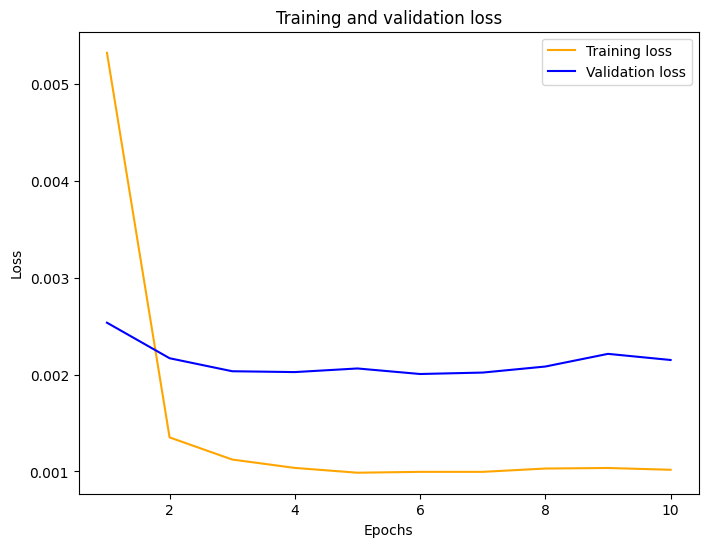

In [91]:
plot_curve(hist_001)

In [92]:
predict_scaled_001 = model_001.predict(X_test)
predict_001 = sc.inverse_transform(predict_scaled_001)
test2['LSTM_001'] = predict_001
test2

95/95 [==============================] - 1s 3ms/step


,DateTime,cloud_cover,LSTM_01,LSTM_005,LSTM_001
0,2021-12-10 15:24:00,0.538,0.536176,0.554719,0.540890
1,2021-12-10 15:25:00,0.588,0.526025,0.542123,0.522533
2,2021-12-10 15:26:00,0.566,0.589028,0.602607,0.576062
3,2021-12-10 15:27:00,0.562,0.563196,0.569352,0.547301
4,2021-12-10 15:28:00,0.612,0.553260,0.567181,0.547774
...,...,...,...,...,...
3008,2021-12-16 13:58:00,0.168,0.166788,0.166853,0.162491
3009,2021-12-16 13:59:00,0.169,0.166380,0.167379,0.162535
3010,2021-12-16 14:00:00,0.147,0.167996,0.168440,0.163492
3011,2021-12-16 14:01:00,0.145,0.144718,0.143062,0.141928


In [93]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test2['DateTime'], y = test2['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test2['DateTime'], y = test2['LSTM_001'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [94]:
lstm_mse_error_001 = mean_squared_error(test2['cloud_cover'], test2['LSTM_001'], squared=True)
lstm_rmse_error5 = mean_squared_error(test2["cloud_cover"], test2["LSTM_001"], squared=False)
lstm_mae_error5 = mae(test2["cloud_cover"], test2["LSTM_001"])
lstm_mape_error5 = mape(test2['cloud_cover'], test2['LSTM_001'])
error(lstm_mse_error_001,lstm_rmse_error5,lstm_mae_error5,lstm_mape_error5)

[{'MSE': 0.002139501699789173,
  'RMSE': 0.04625474786212949,
  'MAE': 0.02435374897315361,
  'MAPE': 0.08101088827570456}]

In [95]:
compare_model(lstm_mape_error3,lstm_mape_error5)

Better MSE value is :  0.0774362034791545


,Model,MSE error
0,model,0.077436
1,model_1,0.081011


In [156]:
data5 = [{'Lags':20 ,'Optimizer':'Adam', 'Batch_size':32, 'Learning rate':0.01, 'Frist layer': 50, 'Drop out':'', 'Second layer':'', 'Drop out2':'',
              'Third layer':'','Output layer':1, 'Epochs':10 , 'MAE error':lstm_mae_error5, 'MAPE error' : lstm_mape_error5,'MSE error':lstm_mse_error_001, 'RMSE error':lstm_rmse_error5}]

mse_data = mse_data.append(data5,ignore_index = True,sort = False)
mse_data

C:\Users\USER\AppData\Local\Temp\ipykernel_15584\883227547.py:4: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



,Lags,Optimizer,Batch_size,Learning rate,Frist layer,Drop out,Second layer,Drop out2,Third layer,Output layer,Epochs,MAE error,MAPE error,MSE error,RMSE error
0,20,Adam,32,,50,,,,,1,10,0.020944,0.077680,0.001977,0.044458
1,20,RMSprop,32,,50,,,,,1,10,0.022332,0.103089,0.002051,0.045292
2,20,Adam,64,,50,,,,,1,10,0.024254,0.090601,0.002132,0.046170
3,20,Adam,32,0.1,50,,,,,1,10,0.021808,0.077436,0.002142,0.046281
4,20,Adam,32,0.05,50,,,,,1,10,0.025341,0.107421,0.002387,0.048852
5,20,Adam,32,0.01,50,,,,,1,10,0.024354,0.081011,0.002140,0.046255


----------------------------------------------------------------------------------

### lr 0.005

#### Add frist layer: units = 50

In [97]:
model_0005 = Sequential()
model_0005.add(LSTM(units = 50, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_0005.add(Dense(units = 1))
opt = optimizers.Adam(learning_rate=0.005)
model_0005.compile(optimizer = opt, loss = 'mean_squared_error')
hist_0005 = model_0005.fit(X_train, y_train, validation_data=(X_test, y_test), epochs = 10, batch_size = 32)

Epoch 1/10
376/376 [==============================] - 8s 13ms/step - loss: 0.0055 - val_loss: 0.0029
Epoch 2/10
376/376 [==============================] - 3s 9ms/step - loss: 0.0014 - val_loss: 0.0022
Epoch 3/10
376/376 [==============================] - 3s 9ms/step - loss: 0.0011 - val_loss: 0.0020
Epoch 4/10
376/376 [==============================] - 3s 8ms/step - loss: 0.0010 - val_loss: 0.0021
Epoch 5/10
376/376 [==============================] - 3s 8ms/step - loss: 0.0010 - val_loss: 0.0024
Epoch 6/10
376/376 [==============================] - 3s 9ms/step - loss: 9.9214e-04 - val_loss: 0.0021
Epoch 7/10
376/376 [==============================] - 3s 8ms/step - loss: 9.9342e-04 - val_loss: 0.0020
Epoch 8/10
376/376 [==============================] - 3s 8ms/step - loss: 9.8476e-04 - val_loss: 0.0021
Epoch 9/10
376/376 [==============================] - 3s 8ms/step - loss: 9.8040e-04 - val_loss: 0.0021
Epoch 10/10
376/376 [==============================] - 3s 8ms/step - loss: 9.7947e-

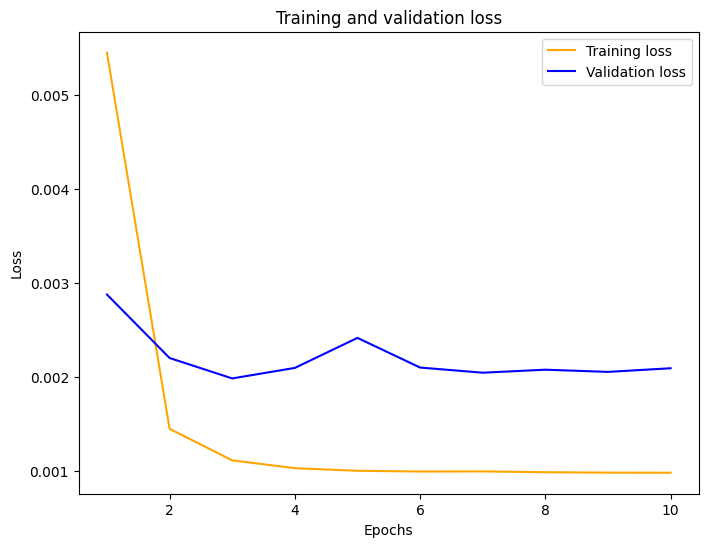

In [98]:
plot_curve(hist_0005)

In [99]:
predict_scaled_0005 = model_0005.predict(X_test)
predict_0005 = sc.inverse_transform(predict_scaled_0005)
test2['LSTM_0005'] = predict_0005
test2

95/95 [==============================] - 1s 3ms/step


,DateTime,cloud_cover,LSTM_01,LSTM_005,LSTM_001,LSTM_0005
0,2021-12-10 15:24:00,0.538,0.536176,0.554719,0.540890,0.557068
1,2021-12-10 15:25:00,0.588,0.526025,0.542123,0.522533,0.539466
2,2021-12-10 15:26:00,0.566,0.589028,0.602607,0.576062,0.596644
3,2021-12-10 15:27:00,0.562,0.563196,0.569352,0.547301,0.566862
4,2021-12-10 15:28:00,0.612,0.553260,0.567181,0.547774,0.565715
...,...,...,...,...,...,...
3008,2021-12-16 13:58:00,0.168,0.166788,0.166853,0.162491,0.169410
3009,2021-12-16 13:59:00,0.169,0.166380,0.167379,0.162535,0.169384
3010,2021-12-16 14:00:00,0.147,0.167996,0.168440,0.163492,0.170419
3011,2021-12-16 14:01:00,0.145,0.144718,0.143062,0.141928,0.148479


In [100]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test2['DateTime'], y = test2['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test2['DateTime'], y = test2['LSTM_0005'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [101]:
lstm_mse_error_unit_50_0005 = mean_squared_error(test2['cloud_cover'], test2['LSTM_0005'], squared=True)
lstm_rmse_error6 = mean_squared_error(test2["cloud_cover"], test2["LSTM_0005"], squared=False)
lstm_mae_error6 = mae(test2["cloud_cover"], test2["LSTM_0005"])
lstm_mape_error6 = mape(test2['cloud_cover'], test2['LSTM_0005'])
error(lstm_mse_error_unit_50_0005,lstm_rmse_error6,lstm_mae_error6,lstm_mape_error6)

[{'MSE': 0.0020819692483245384,
  'RMSE': 0.04562860120937895,
  'MAE': 0.02060335658864052,
  'MAPE': 0.07558608772891041}]

In [102]:
compare_model(lstm_mape_error3,lstm_mape_error6)

Better MSE value is :  0.07558608772891041


,Model,MSE error
0,model,0.077436
1,model_1,0.075586


In [157]:
data5 = [{'Lags':20 ,'Optimizer':'Adam', 'Batch_size':32, 'Learning rate':0.005, 'Frist layer': 50, 'Drop out':'', 'Second layer':'', 'Drop out2':'',
              'Third layer':'','Output layer':1, 'Epochs':10 , 'MAE error':lstm_mae_error6, 'MAPE error' : lstm_mape_error6,'MSE error':lstm_mse_error_unit_50_0005, 'RMSE error':lstm_rmse_error6}]

mse_data = mse_data.append(data5,ignore_index = True,sort = False)
mse_data

C:\Users\USER\AppData\Local\Temp\ipykernel_15584\1036017569.py:4: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



,Lags,Optimizer,Batch_size,Learning rate,Frist layer,Drop out,Second layer,Drop out2,Third layer,Output layer,Epochs,MAE error,MAPE error,MSE error,RMSE error
0,20,Adam,32,,50,,,,,1,10,0.020944,0.077680,0.001977,0.044458
1,20,RMSprop,32,,50,,,,,1,10,0.022332,0.103089,0.002051,0.045292
2,20,Adam,64,,50,,,,,1,10,0.024254,0.090601,0.002132,0.046170
3,20,Adam,32,0.1,50,,,,,1,10,0.021808,0.077436,0.002142,0.046281
4,20,Adam,32,0.05,50,,,,,1,10,0.025341,0.107421,0.002387,0.048852
5,20,Adam,32,0.01,50,,,,,1,10,0.024354,0.081011,0.002140,0.046255
6,20,Adam,32,0.005,50,,,,,1,10,0.020603,0.075586,0.002082,0.045629


----------------------------------------------------------------------------------

### lr 0.001

#### Add frist layer: units = 50

In [103]:
model_0001 = Sequential()
model_0001.add(LSTM(units = 50, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_0001.add(Dense(units = 1))
opt = optimizers.Adam(learning_rate=0.001)
model_0001.compile(optimizer = opt, loss = 'mean_squared_error')
hist_0001 = model_0001.fit(X_train, y_train, validation_data=(X_test, y_test), epochs = 10, batch_size = 32)

Epoch 1/10
376/376 [==============================] - 7s 10ms/step - loss: 0.0092 - val_loss: 0.0039
Epoch 2/10
376/376 [==============================] - 3s 8ms/step - loss: 0.0025 - val_loss: 0.0033
Epoch 3/10
376/376 [==============================] - 3s 8ms/step - loss: 0.0020 - val_loss: 0.0029
Epoch 4/10
376/376 [==============================] - 3s 8ms/step - loss: 0.0017 - val_loss: 0.0026
Epoch 5/10
376/376 [==============================] - 3s 8ms/step - loss: 0.0015 - val_loss: 0.0024
Epoch 6/10
376/376 [==============================] - 3s 8ms/step - loss: 0.0013 - val_loss: 0.0023
Epoch 7/10
376/376 [==============================] - 3s 8ms/step - loss: 0.0012 - val_loss: 0.0022
Epoch 8/10
376/376 [==============================] - 3s 8ms/step - loss: 0.0011 - val_loss: 0.0021
Epoch 9/10
376/376 [==============================] - 3s 8ms/step - loss: 0.0011 - val_loss: 0.0020
Epoch 10/10
376/376 [==============================] - 3s 8ms/step - loss: 0.0010 - val_loss: 0.002

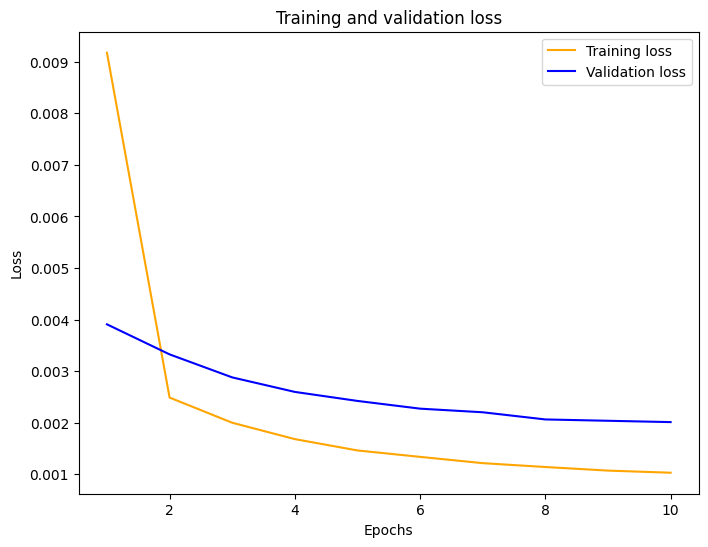

In [104]:
plot_curve(hist_0001)

In [105]:
predict_scaled_0001 = model_001.predict(X_test)
predict_0001 = sc.inverse_transform(predict_scaled_0001)
test2['LSTM_0001'] = predict_0001
test2

95/95 [==============================] - 0s 3ms/step


,DateTime,cloud_cover,LSTM_01,LSTM_005,LSTM_001,LSTM_0005,LSTM_0001
0,2021-12-10 15:24:00,0.538,0.536176,0.554719,0.540890,0.557068,0.540890
1,2021-12-10 15:25:00,0.588,0.526025,0.542123,0.522533,0.539466,0.522533
2,2021-12-10 15:26:00,0.566,0.589028,0.602607,0.576062,0.596644,0.576062
3,2021-12-10 15:27:00,0.562,0.563196,0.569352,0.547301,0.566862,0.547301
4,2021-12-10 15:28:00,0.612,0.553260,0.567181,0.547774,0.565715,0.547774
...,...,...,...,...,...,...,...
3008,2021-12-16 13:58:00,0.168,0.166788,0.166853,0.162491,0.169410,0.162491
3009,2021-12-16 13:59:00,0.169,0.166380,0.167379,0.162535,0.169384,0.162535
3010,2021-12-16 14:00:00,0.147,0.167996,0.168440,0.163492,0.170419,0.163492
3011,2021-12-16 14:01:00,0.145,0.144718,0.143062,0.141928,0.148479,0.141928


In [106]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test2['DateTime'], y = test2['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test2['DateTime'], y = test2['LSTM_0001'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [107]:
lstm_mse_error_0001 = mean_squared_error(test2['cloud_cover'], test2['LSTM_0001'], squared=True)
lstm_rmse_error7 = mean_squared_error(test2["cloud_cover"], test2["LSTM_0001"], squared=False)
lstm_mae_error7 = mae(test2["cloud_cover"], test2["LSTM_0001"])
lstm_mape_error7 = mape(test2['cloud_cover'], test2['LSTM_0001'])
error(lstm_mse_error_0001,lstm_rmse_error7,lstm_mae_error7,lstm_mape_error7)


[{'MSE': 0.002139501699789173,
  'RMSE': 0.04625474786212949,
  'MAE': 0.02435374897315361,
  'MAPE': 0.08101088827570456}]

In [108]:
compare_model(lstm_mape_error6,lstm_mape_error7)

Better MSE value is :  0.07558608772891041


,Model,MSE error
0,model,0.075586
1,model_1,0.081011


In [158]:
data6 = [{'Lags':20 ,'Optimizer':'Adam', 'Batch_size':32, 'Learning rate':0.001, 'Frist layer': 50, 'Drop out':'', 'Second layer':'', 'Drop out2':'',
              'Third layer':'','Output layer':1, 'Epochs':10 , 'MAE error':lstm_mae_error7, 'MAPE error' : lstm_mape_error7,'MSE error':lstm_mse_error_0001, 'RMSE error':lstm_rmse_error7}]

mse_data = mse_data.append(data6,ignore_index = True,sort = False)
mse_data

C:\Users\USER\AppData\Local\Temp\ipykernel_15584\1029543677.py:4: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



,Lags,Optimizer,Batch_size,Learning rate,Frist layer,Drop out,Second layer,Drop out2,Third layer,Output layer,Epochs,MAE error,MAPE error,MSE error,RMSE error
0,20,Adam,32,,50,,,,,1,10,0.020944,0.077680,0.001977,0.044458
1,20,RMSprop,32,,50,,,,,1,10,0.022332,0.103089,0.002051,0.045292
2,20,Adam,64,,50,,,,,1,10,0.024254,0.090601,0.002132,0.046170
3,20,Adam,32,0.1,50,,,,,1,10,0.021808,0.077436,0.002142,0.046281
4,20,Adam,32,0.05,50,,,,,1,10,0.025341,0.107421,0.002387,0.048852
5,20,Adam,32,0.01,50,,,,,1,10,0.024354,0.081011,0.002140,0.046255
6,20,Adam,32,0.005,50,,,,,1,10,0.020603,0.075586,0.002082,0.045629
7,20,Adam,32,0.001,50,,,,,1,10,0.024354,0.081011,0.002140,0.046255


----------------------------------------------------------------------------------

## Optimizer adam

### Add frist layer: units = 100

In [110]:
test3 = test.copy()

In [112]:
test3['LSTM_50'] = predict_0005

In [113]:
model_1 = Sequential()
model_1.add(LSTM(units = 100, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_1.add(Dense(units = 1))
opt = optimizers.Adam(learning_rate=0.005)
model_1.compile(optimizer = opt, loss = 'mean_squared_error')
hist_1 = model_1.fit(X_train, y_train, validation_data=(X_test, y_test), epochs = 10, batch_size = 32)

Epoch 1/10
376/376 [==============================] - 10s 17ms/step - loss: 0.0044 - val_loss: 0.0029
Epoch 2/10
376/376 [==============================] - 5s 14ms/step - loss: 0.0015 - val_loss: 0.0023
Epoch 3/10
376/376 [==============================] - 5s 13ms/step - loss: 0.0012 - val_loss: 0.0021
Epoch 4/10
376/376 [==============================] - 5s 13ms/step - loss: 0.0011 - val_loss: 0.0022
Epoch 5/10
376/376 [==============================] - 5s 13ms/step - loss: 0.0010 - val_loss: 0.0022
Epoch 6/10
376/376 [==============================] - 5s 12ms/step - loss: 0.0010 - val_loss: 0.0021
Epoch 7/10
376/376 [==============================] - 5s 13ms/step - loss: 0.0010 - val_loss: 0.0021
Epoch 8/10
376/376 [==============================] - 5s 12ms/step - loss: 9.9107e-04 - val_loss: 0.0021
Epoch 9/10
376/376 [==============================] - 5s 12ms/step - loss: 0.0010 - val_loss: 0.0020
Epoch 10/10
376/376 [==============================] - 5s 12ms/step - loss: 0.0010 - v

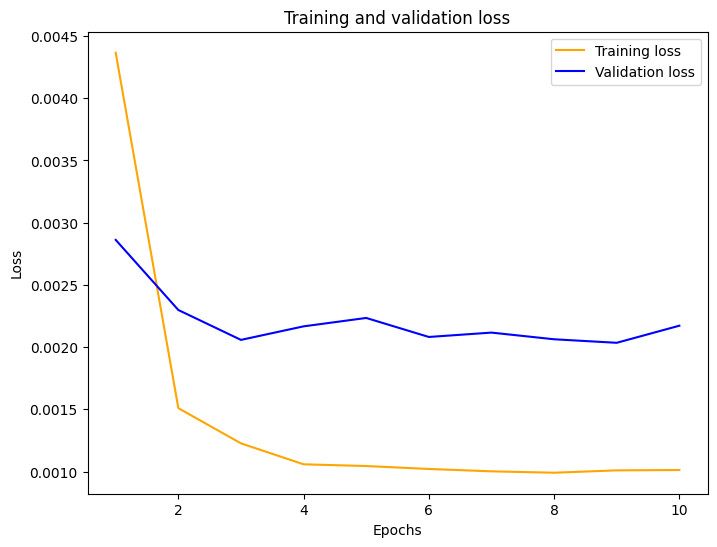

In [114]:
plot_curve(hist_1)

In [115]:
predict_scaled_1 = model_1.predict(X_test)
predict_1 = sc.inverse_transform(predict_scaled_1)
test3['LSTM_100'] = predict_1
test3

95/95 [==============================] - 1s 4ms/step


,DateTime,cloud_cover,LSTM_50,LSTM_100
0,2021-12-10 15:24:00,0.538,0.557068,0.563867
1,2021-12-10 15:25:00,0.588,0.539466,0.547572
2,2021-12-10 15:26:00,0.566,0.596644,0.600728
3,2021-12-10 15:27:00,0.562,0.566862,0.575990
4,2021-12-10 15:28:00,0.612,0.565715,0.572714
...,...,...,...,...
3008,2021-12-16 13:58:00,0.168,0.169410,0.182177
3009,2021-12-16 13:59:00,0.169,0.169384,0.182082
3010,2021-12-16 14:00:00,0.147,0.170419,0.183092
3011,2021-12-16 14:01:00,0.145,0.148479,0.161702


In [116]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test3['DateTime'], y = test3['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test3['DateTime'], y = test3['LSTM_100'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [117]:
lstm_mse_error_unit_100 = mean_squared_error(test3['cloud_cover'], test3['LSTM_100'], squared=True)
lstm_rmse_error8 = mean_squared_error(test3["cloud_cover"], test3["LSTM_100"], squared=False)
lstm_mae_error8 = mae(test3["cloud_cover"], test3["LSTM_100"])
lstm_mape_error8 = mape(test3['cloud_cover'], test3['LSTM_100'])
error(lstm_mse_error_unit_100,lstm_rmse_error8,lstm_mae_error8,lstm_mape_error8)

[{'MSE': 0.002161234969384656,
  'RMSE': 0.04648908441112447,
  'MAE': 0.025167506603225497,
  'MAPE': 0.129331467112021}]

In [118]:
compare_model(lstm_mape_error6,lstm_mape_error8)

Better MSE value is :  0.07558608772891041


,Model,MSE error
0,model,0.075586
1,model_1,0.129331


In [159]:
data7 = [{'Lags':20 ,'Optimizer':'Adam', 'Batch_size':32, 'Learning rate':0.005, 'Frist layer': 100, 'Drop out':'', 'Second layer':'', 'Drop out2':'',
              'Third layer':'','Output layer':1, 'Epochs':10 , 'MAE error':lstm_mae_error8, 'MAPE error' : lstm_mape_error8,'MSE error':lstm_mse_error_unit_100, 'RMSE error':lstm_rmse_error8}]

mse_data = mse_data.append(data7,ignore_index = True,sort = False)
mse_data

C:\Users\USER\AppData\Local\Temp\ipykernel_15584\2891328176.py:4: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



,Lags,Optimizer,Batch_size,Learning rate,Frist layer,Drop out,Second layer,Drop out2,Third layer,Output layer,Epochs,MAE error,MAPE error,MSE error,RMSE error
0,20,Adam,32,,50,,,,,1,10,0.020944,0.077680,0.001977,0.044458
1,20,RMSprop,32,,50,,,,,1,10,0.022332,0.103089,0.002051,0.045292
2,20,Adam,64,,50,,,,,1,10,0.024254,0.090601,0.002132,0.046170
3,20,Adam,32,0.1,50,,,,,1,10,0.021808,0.077436,0.002142,0.046281
4,20,Adam,32,0.05,50,,,,,1,10,0.025341,0.107421,0.002387,0.048852
5,20,Adam,32,0.01,50,,,,,1,10,0.024354,0.081011,0.002140,0.046255
6,20,Adam,32,0.005,50,,,,,1,10,0.020603,0.075586,0.002082,0.045629
7,20,Adam,32,0.001,50,,,,,1,10,0.024354,0.081011,0.002140,0.046255
8,20,Adam,32,0.005,100,,,,,1,10,0.025168,0.129331,0.002161,0.046489


------------

### Add frist layer: units = 50 and Add Dropout = 0.1

In [120]:
model_2 = Sequential()
model_2.add(LSTM(units = 50, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_2.add(Dropout(0.1))
model_2.add(Dense(units = 1))
opt = optimizers.Adam(learning_rate=0.005)
model_2.compile(optimizer = opt, loss = 'mean_squared_error')
hist_2 = model_2.fit(X_train, y_train, validation_data=(X_test, y_test), epochs = 10, batch_size = 32)

Epoch 1/10
376/376 [==============================] - 9s 14ms/step - loss: 0.0043 - val_loss: 0.0026
Epoch 2/10
376/376 [==============================] - 4s 9ms/step - loss: 0.0022 - val_loss: 0.0022
Epoch 3/10
376/376 [==============================] - 3s 9ms/step - loss: 0.0018 - val_loss: 0.0020
Epoch 4/10
376/376 [==============================] - 3s 9ms/step - loss: 0.0016 - val_loss: 0.0020
Epoch 5/10
376/376 [==============================] - 3s 8ms/step - loss: 0.0015 - val_loss: 0.0021
Epoch 6/10
376/376 [==============================] - 3s 9ms/step - loss: 0.0014 - val_loss: 0.0021
Epoch 7/10
376/376 [==============================] - 3s 9ms/step - loss: 0.0014 - val_loss: 0.0022
Epoch 8/10
376/376 [==============================] - 3s 9ms/step - loss: 0.0014 - val_loss: 0.0020
Epoch 9/10
376/376 [==============================] - 3s 8ms/step - loss: 0.0014 - val_loss: 0.0021
Epoch 10/10
376/376 [==============================] - 3s 8ms/step - loss: 0.0013 - val_loss: 0.002

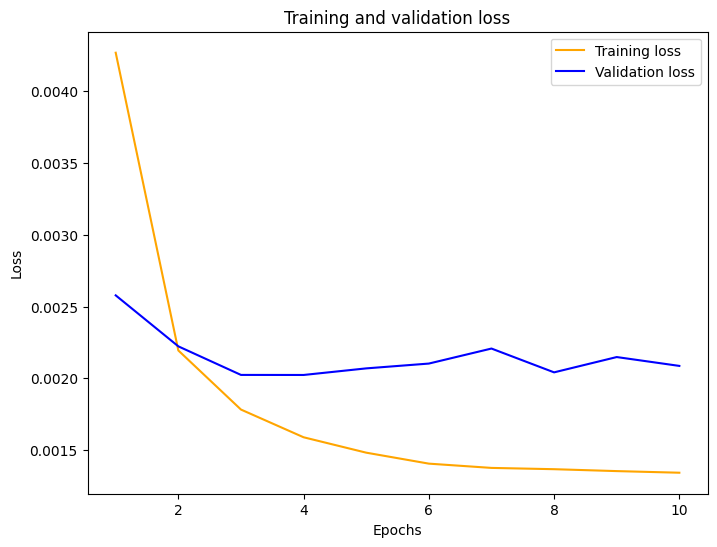

In [121]:
plot_curve(hist_2)

In [122]:
predict_scaled_2 = model_2.predict(X_test)
predict_2 = sc.inverse_transform(predict_scaled_2)
test3['LSTM_Drop_out'] = predict_2
test3

95/95 [==============================] - 1s 3ms/step


,DateTime,cloud_cover,LSTM_50,LSTM_100,LSTM_Drop_out
0,2021-12-10 15:24:00,0.538,0.557068,0.563867,0.558825
1,2021-12-10 15:25:00,0.588,0.539466,0.547572,0.543201
2,2021-12-10 15:26:00,0.566,0.596644,0.600728,0.596082
3,2021-12-10 15:27:00,0.562,0.566862,0.575990,0.572281
4,2021-12-10 15:28:00,0.612,0.565715,0.572714,0.567805
...,...,...,...,...,...
3008,2021-12-16 13:58:00,0.168,0.169410,0.182177,0.175664
3009,2021-12-16 13:59:00,0.169,0.169384,0.182082,0.175529
3010,2021-12-16 14:00:00,0.147,0.170419,0.183092,0.176535
3011,2021-12-16 14:01:00,0.145,0.148479,0.161702,0.155180


In [123]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test3['DateTime'], y = test3['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test3['DateTime'], y = test3['LSTM_Drop_out'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [124]:
lstm_mse_error_drop_out = mean_squared_error(test3['cloud_cover'], test3['LSTM_Drop_out'], squared=True)
lstm_rmse_error9 = mean_squared_error(test3["cloud_cover"], test3["LSTM_Drop_out"], squared=False)
lstm_mae_error9 = mae(test3["cloud_cover"], test3["LSTM_Drop_out"])
lstm_mape_error9 = mape(test3['cloud_cover'], test3['LSTM_Drop_out'])
error(lstm_mse_error_drop_out,lstm_rmse_error9,lstm_mae_error9,lstm_mape_error9)

[{'MSE': 0.0020754457297644992,
  'RMSE': 0.04555706015278531,
  'MAE': 0.02200612851509987,
  'MAPE': 0.09463441012421825}]

In [125]:
compare_model(lstm_mape_error6,lstm_mape_error9)

Better MSE value is :  0.07558608772891041


,Model,MSE error
0,model,0.075586
1,model_1,0.094634


In [160]:
data8 = [{'Lags':20 ,'Optimizer':'Adam', 'Batch_size':32, 'Learning rate':0.005, 'Frist layer': 50, 'Drop out':0.1, 'Second layer':'', 'Drop out2':'',
              'Third layer':'','Output layer':1, 'Epochs':10 , 'MAE error':lstm_mae_error9, 'MAPE error' : lstm_mape_error9,'MSE error':lstm_mse_error_drop_out, 'RMSE error':lstm_rmse_error9}]

mse_data = mse_data.append(data8,ignore_index = True,sort = False)
mse_data

C:\Users\USER\AppData\Local\Temp\ipykernel_15584\3485272795.py:4: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



,Lags,Optimizer,Batch_size,Learning rate,Frist layer,Drop out,Second layer,Drop out2,Third layer,Output layer,Epochs,MAE error,MAPE error,MSE error,RMSE error
0,20,Adam,32,,50,,,,,1,10,0.020944,0.077680,0.001977,0.044458
1,20,RMSprop,32,,50,,,,,1,10,0.022332,0.103089,0.002051,0.045292
2,20,Adam,64,,50,,,,,1,10,0.024254,0.090601,0.002132,0.046170
3,20,Adam,32,0.1,50,,,,,1,10,0.021808,0.077436,0.002142,0.046281
4,20,Adam,32,0.05,50,,,,,1,10,0.025341,0.107421,0.002387,0.048852
5,20,Adam,32,0.01,50,,,,,1,10,0.024354,0.081011,0.002140,0.046255
6,20,Adam,32,0.005,50,,,,,1,10,0.020603,0.075586,0.002082,0.045629
7,20,Adam,32,0.001,50,,,,,1,10,0.024354,0.081011,0.002140,0.046255
8,20,Adam,32,0.005,100,,,,,1,10,0.025168,0.129331,0.002161,0.046489
9,20,Adam,32,0.005,50,0.1,,,,1,10,0.022006,0.094634,0.002075,0.045557


------------------------------------

### Add frist layer: units = 50 and Add second layer: unit = 50

In [127]:
model_3 = Sequential()
model_3.add(LSTM(units = 50, return_sequences = True, input_shape = (X_train.shape[1], 1)))
model_3.add(LSTM(units = 50))
model_3.add(Dense(units = 1))
opt = optimizers.Adam(learning_rate=0.005)
model_3.compile(optimizer = opt, loss = 'mean_squared_error')
hist_3 = model_3.fit(X_train, y_train, validation_data=(X_test, y_test),  epochs = 10, batch_size = 32)

Epoch 1/10
376/376 [==============================] - 14s 20ms/step - loss: 0.0046 - val_loss: 0.0029
Epoch 2/10
376/376 [==============================] - 6s 16ms/step - loss: 0.0014 - val_loss: 0.0021
Epoch 3/10
376/376 [==============================] - 6s 16ms/step - loss: 0.0011 - val_loss: 0.0021
Epoch 4/10
376/376 [==============================] - 6s 16ms/step - loss: 0.0010 - val_loss: 0.0021
Epoch 5/10
376/376 [==============================] - 6s 15ms/step - loss: 0.0010 - val_loss: 0.0030
Epoch 6/10
376/376 [==============================] - 6s 16ms/step - loss: 0.0011 - val_loss: 0.0021
Epoch 7/10
376/376 [==============================] - 6s 16ms/step - loss: 0.0010 - val_loss: 0.0021
Epoch 8/10
376/376 [==============================] - 6s 15ms/step - loss: 0.0011 - val_loss: 0.0022
Epoch 9/10
376/376 [==============================] - 6s 16ms/step - loss: 0.0010 - val_loss: 0.0021
Epoch 10/10
376/376 [==============================] - 6s 16ms/step - loss: 0.0011 - val_l

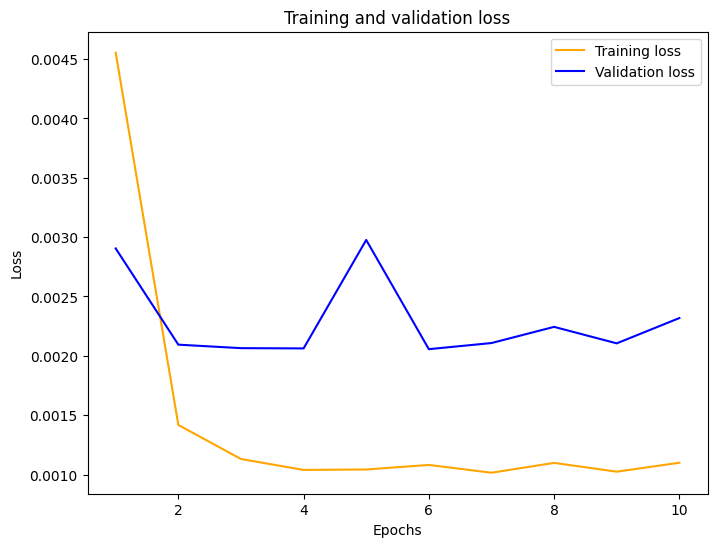

In [128]:
plot_curve(hist_3)

In [129]:
predict_scaled_3 = model_3.predict(X_test)
predict_3 = sc.inverse_transform(predict_scaled_3)
test3['LSTM_second_layer_50'] = predict_3
test3

95/95 [==============================] - 2s 9ms/step


,DateTime,cloud_cover,LSTM_50,LSTM_100,LSTM_Drop_out,LSTM_second_layer_50
0,2021-12-10 15:24:00,0.538,0.557068,0.563867,0.558825,0.564460
1,2021-12-10 15:25:00,0.588,0.539466,0.547572,0.543201,0.548956
2,2021-12-10 15:26:00,0.566,0.596644,0.600728,0.596082,0.606829
3,2021-12-10 15:27:00,0.562,0.566862,0.575990,0.572281,0.577021
4,2021-12-10 15:28:00,0.612,0.565715,0.572714,0.567805,0.574472
...,...,...,...,...,...,...
3008,2021-12-16 13:58:00,0.168,0.169410,0.182177,0.175664,0.185890
3009,2021-12-16 13:59:00,0.169,0.169384,0.182082,0.175529,0.185912
3010,2021-12-16 14:00:00,0.147,0.170419,0.183092,0.176535,0.186898
3011,2021-12-16 14:01:00,0.145,0.148479,0.161702,0.155180,0.165729


In [130]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test3['DateTime'], y = test3['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test3['DateTime'], y = test3['LSTM_second_layer_50'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [131]:
lstm_mse_error_second_layer = mean_squared_error(test3['cloud_cover'], test3['LSTM_second_layer_50'], squared=True)
lstm_rmse_error11 = mean_squared_error(test3["cloud_cover"], test3["LSTM_second_layer_50"], squared=False)
lstm_mae_error11 = mae(test3["cloud_cover"], test3["LSTM_second_layer_50"])
lstm_mape_error11 = mape(test3['cloud_cover'], test3['LSTM_second_layer_50'])
error(lstm_mse_error_second_layer,lstm_rmse_error11,lstm_mae_error11,lstm_mape_error11)


[{'MSE': 0.002306677051337827,
  'RMSE': 0.04802787785586437,
  'MAE': 0.028264685009351174,
  'MAPE': 0.17419338173856658}]

In [132]:
compare_model(lstm_mape_error6,lstm_mape_error11)

Better MSE value is :  0.07558608772891041


,Model,MSE error
0,model,0.075586
1,model_1,0.174193


In [161]:
data10 = [{'Lags':20 ,'Optimizer':'Adam', 'Batch_size':32, 'Learning rate':0.005, 'Frist layer': 50, 'Drop out':'', 'Second layer':50, 'Drop out2':'',
              'Third layer':'','Output layer':1, 'Epochs':10 , 'MAE error':lstm_mae_error11, 'MAPE error' : lstm_mape_error11,'MSE error':lstm_mse_error_second_layer, 'RMSE error':lstm_rmse_error11}]

mse_data = mse_data.append(data10,ignore_index = True,sort = False)
mse_data

C:\Users\USER\AppData\Local\Temp\ipykernel_15584\2611892458.py:4: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



,Lags,Optimizer,Batch_size,Learning rate,Frist layer,Drop out,Second layer,Drop out2,Third layer,Output layer,Epochs,MAE error,MAPE error,MSE error,RMSE error
0,20,Adam,32,,50,,,,,1,10,0.020944,0.077680,0.001977,0.044458
1,20,RMSprop,32,,50,,,,,1,10,0.022332,0.103089,0.002051,0.045292
2,20,Adam,64,,50,,,,,1,10,0.024254,0.090601,0.002132,0.046170
3,20,Adam,32,0.1,50,,,,,1,10,0.021808,0.077436,0.002142,0.046281
4,20,Adam,32,0.05,50,,,,,1,10,0.025341,0.107421,0.002387,0.048852
5,20,Adam,32,0.01,50,,,,,1,10,0.024354,0.081011,0.002140,0.046255
6,20,Adam,32,0.005,50,,,,,1,10,0.020603,0.075586,0.002082,0.045629
7,20,Adam,32,0.001,50,,,,,1,10,0.024354,0.081011,0.002140,0.046255
8,20,Adam,32,0.005,100,,,,,1,10,0.025168,0.129331,0.002161,0.046489
9,20,Adam,32,0.005,50,0.1,,,,1,10,0.022006,0.094634,0.002075,0.045557


---

### Add frist layer: units = 50 and change epochs from 10 to 20

In [140]:
model_5 = Sequential()
model_5.add(LSTM(units = 50, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_5.add(Dense(units = 1))
opt = optimizers.Adam(learning_rate=0.005)
model_5.compile(optimizer = opt, loss = 'mean_squared_error')
hist_5 = model_5.fit(X_train, y_train, validation_data=(X_test, y_test), epochs = 20, batch_size = 32)

Epoch 1/20
376/376 [==============================] - 7s 10ms/step - loss: 0.0049 - val_loss: 0.0029
Epoch 2/20
376/376 [==============================] - 3s 8ms/step - loss: 0.0016 - val_loss: 0.0024
Epoch 3/20
376/376 [==============================] - 3s 8ms/step - loss: 0.0013 - val_loss: 0.0021
Epoch 4/20
376/376 [==============================] - 3s 7ms/step - loss: 0.0011 - val_loss: 0.0020
Epoch 5/20
376/376 [==============================] - 3s 7ms/step - loss: 9.8973e-04 - val_loss: 0.0020
Epoch 6/20
376/376 [==============================] - 3s 7ms/step - loss: 0.0010 - val_loss: 0.0023
Epoch 7/20
376/376 [==============================] - 3s 7ms/step - loss: 9.8317e-04 - val_loss: 0.0021
Epoch 8/20
376/376 [==============================] - 3s 8ms/step - loss: 0.0010 - val_loss: 0.0021
Epoch 9/20
376/376 [==============================] - 3s 7ms/step - loss: 9.8519e-04 - val_loss: 0.0020
Epoch 10/20
376/376 [==============================] - 3s 7ms/step - loss: 9.7907e-04 -

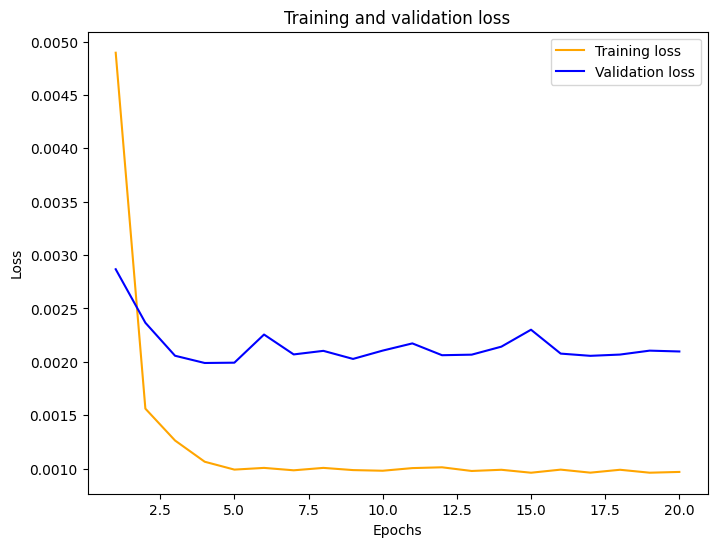

In [141]:
plot_curve(hist_5)

In [142]:
predict_scaled_5 = model_5.predict(X_test)
predict_5 = sc.inverse_transform(predict_scaled_5)
test3['LSTM_epoch20'] = predict_5
test3

95/95 [==============================] - 1s 3ms/step


,DateTime,cloud_cover,LSTM_50,LSTM_100,LSTM_Drop_out,LSTM_second_layer_50,LSTM_epoch20
0,2021-12-10 15:24:00,0.538,0.557068,0.563867,0.558825,0.564460,0.557498
1,2021-12-10 15:25:00,0.588,0.539466,0.547572,0.543201,0.548956,0.538532
2,2021-12-10 15:26:00,0.566,0.596644,0.600728,0.596082,0.606829,0.595827
3,2021-12-10 15:27:00,0.562,0.566862,0.575990,0.572281,0.577021,0.562875
4,2021-12-10 15:28:00,0.612,0.565715,0.572714,0.567805,0.574472,0.564606
...,...,...,...,...,...,...,...
3008,2021-12-16 13:58:00,0.168,0.169410,0.182177,0.175664,0.185890,0.175752
3009,2021-12-16 13:59:00,0.169,0.169384,0.182082,0.175529,0.185912,0.175999
3010,2021-12-16 14:00:00,0.147,0.170419,0.183092,0.176535,0.186898,0.176986
3011,2021-12-16 14:01:00,0.145,0.148479,0.161702,0.155180,0.165729,0.154160


In [143]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test3['DateTime'], y = test3['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test3['DateTime'], y = test3['LSTM_epoch20'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [144]:
lstm_mse_error_unit_50_epoch20 = mean_squared_error(test3['cloud_cover'], test3['LSTM_epoch20'], squared=True)
lstm_rmse_error12 = mean_squared_error(test3["cloud_cover"], test3["LSTM_epoch20"], squared=False)
lstm_mae_error12 = mae(test3["cloud_cover"], test3["LSTM_epoch20"])
lstm_mape_error12 = mape(test3['cloud_cover'], test3['LSTM_epoch20'])
error(lstm_mse_error_unit_50_epoch20,lstm_rmse_error12,lstm_mae_error12,lstm_mape_error12)

[{'MSE': 0.0020860968441933103,
  'RMSE': 0.04567380917104802,
  'MAE': 0.023093068169471317,
  'MAPE': 0.11409615381466354}]

In [145]:
compare_model(lstm_mape_error6,lstm_mape_error12)

Better MSE value is :  0.07558608772891041


,Model,MSE error
0,model,0.075586
1,model_1,0.114096


In [162]:
data11 = [{'Lags':20 ,'Optimizer':'Adam', 'Batch_size':32, 'Learning rate':0.005, 'Frist layer': 50, 'Drop out':'', 'Second layer':'', 'Drop out2':'',
              'Third layer':'','Output layer':1, 'Epochs':20 , 'MAE error':lstm_mae_error12, 'MAPE error' : lstm_mape_error12,'MSE error':lstm_mse_error_unit_50_epoch20, 'RMSE error':lstm_rmse_error12}]

mse_data = mse_data.append(data11,ignore_index = True,sort = False)
mse_data

C:\Users\USER\AppData\Local\Temp\ipykernel_15584\258410508.py:4: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



,Lags,Optimizer,Batch_size,Learning rate,Frist layer,Drop out,Second layer,Drop out2,Third layer,Output layer,Epochs,MAE error,MAPE error,MSE error,RMSE error
0,20,Adam,32,,50,,,,,1,10,0.020944,0.077680,0.001977,0.044458
1,20,RMSprop,32,,50,,,,,1,10,0.022332,0.103089,0.002051,0.045292
2,20,Adam,64,,50,,,,,1,10,0.024254,0.090601,0.002132,0.046170
3,20,Adam,32,0.1,50,,,,,1,10,0.021808,0.077436,0.002142,0.046281
4,20,Adam,32,0.05,50,,,,,1,10,0.025341,0.107421,0.002387,0.048852
5,20,Adam,32,0.01,50,,,,,1,10,0.024354,0.081011,0.002140,0.046255
6,20,Adam,32,0.005,50,,,,,1,10,0.020603,0.075586,0.002082,0.045629
7,20,Adam,32,0.001,50,,,,,1,10,0.024354,0.081011,0.002140,0.046255
8,20,Adam,32,0.005,100,,,,,1,10,0.025168,0.129331,0.002161,0.046489
9,20,Adam,32,0.005,50,0.1,,,,1,10,0.022006,0.094634,0.002075,0.045557


---

# save model

In [ ]:
mse_data = mse_data.round({"MSE error": 6, "MAE error": 6, "MAPE error": 6, "RMSE error": 6})

In [163]:
mse_data.to_csv('data_lstm_mse_lag20.csv',index=False)

In [164]:
lstm = pd.read_csv('data_lstm_mse_lag20.csv')

In [165]:
lstm

,Lags,Optimizer,Batch_size,Learning rate,Frist layer,Drop out,Second layer,Drop out2,Third layer,Output layer,Epochs,MAE error,MAPE error,MSE error,RMSE error
0,20,Adam,32,NaN,50,NaN,NaN,NaN,NaN,1,10,0.020944,0.077680,0.001977,0.044458
1,20,RMSprop,32,NaN,50,NaN,NaN,NaN,NaN,1,10,0.022332,0.103089,0.002051,0.045292
2,20,Adam,64,NaN,50,NaN,NaN,NaN,NaN,1,10,0.024254,0.090601,0.002132,0.046170
3,20,Adam,32,0.100,50,NaN,NaN,NaN,NaN,1,10,0.021808,0.077436,0.002142,0.046281
4,20,Adam,32,0.050,50,NaN,NaN,NaN,NaN,1,10,0.025341,0.107421,0.002387,0.048852
5,20,Adam,32,0.010,50,NaN,NaN,NaN,NaN,1,10,0.024354,0.081011,0.002140,0.046255
6,20,Adam,32,0.005,50,NaN,NaN,NaN,NaN,1,10,0.020603,0.075586,0.002082,0.045629
7,20,Adam,32,0.001,50,NaN,NaN,NaN,NaN,1,10,0.024354,0.081011,0.002140,0.046255
8,20,Adam,32,0.005,100,NaN,NaN,NaN,NaN,1,10,0.025168,0.129331,0.002161,0.046489
9,20,Adam,32,0.005,50,0.1,NaN,NaN,NaN,1,10,0.022006,0.094634,0.002075,0.045557


# error

In [166]:
error = lstm.groupby(['Lags'])[['MAE error','MAPE error','MSE error','RMSE error']].transform(min) == lstm[['MAE error','MAPE error','MSE error','RMSE error']]
lstm[error]

,Lags,Optimizer,Batch_size,Learning rate,Frist layer,Drop out,Second layer,Drop out2,Third layer,Output layer,Epochs,MAE error,MAPE error,MSE error,RMSE error
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.001977,0.044458
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.020603,0.075586,NaN,NaN
7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [167]:
model_0005.save('model_train_80%_lag20.h5')